In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import scvelo as scv
from scipy import io

sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')

# set random seed for reproducibility:
np.random.seed(42)


In [14]:
sc.__version__

'1.8.1'

In [3]:
# set working dir 
os.chdir('/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Swarup_2021/')

fig_dir = 'figures/'
data_dir = 'data/'


In [12]:
# re-load processed
adata = sc.read_h5ad('{}/Swarup_2021_processed.h5ad'.format(data_dir))
adata

AnnData object with n_obs × n_vars = 57950 × 36601
    obs: 'orig_barcode', 'n_counts', 'doublet_scores', 'doublets', 'Sample', 'Study', 'batch', 'barcode', 'Sample.ID', 'Case.Year', 'YEAR', 'Batch', 'Case.Num', 'SampleID_Box', 'Region', 'Neuropath.Dx.1', 'Neuropath.Dx.2', 'FCx..g.', 'CBL..g.', 'Age', 'Sex', 'PMI', 'APoE', 'Clinical.Syndrome', 'Tangle.Stage', 'Plaque.Stage', 'Diagnosis', 'Plaques.Tangles', 'Braak...Braak.Stage', 'RIN.MOD', 'RNA.Concentration', 'Exp date', 'i7-Sample Index', 'Total cells', 'Genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'annotation'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Batch_colors', 'Sample_colors', 'annotation_colors', 'dendrogra

In [13]:
adata.layers['spliced'].shape

(57950, 36601)

## Load Morabito & Miyoshi 2021 AD dataset

In [3]:
count_data_dir = '/dfs3b/swaruplab/shared_lab/cross-disorder/count_matrices/AD_Swarup/'
samples = [s for s in os.listdir(count_data_dir)]
adata_list = []
for sample in samples:
    try:
        adata = sc.read_h5ad('{}{}/scanpy_preprocessing_cellbender/data/adata_unfiltered.h5ad'.format(count_data_dir, sample))
    except:
        print('sample', sample, ' error')
        continue
    adata.obs['Sample'] = sample
    adata.obs['Study'] = 'Swarup_2021'
    adata.obs['orig_barcode'] = adata.obs.index

    adata_list.append(adata)

    print(sample, adata.layers['spliced'].shape)


Sample-100 (4856, 36601)
Sample-45 (4797, 36601)
Sample-47 (2947, 36601)
Sample-17 (4208, 36601)
Sample-19 (3882, 36601)
Sample-43 (4850, 36601)
Sample-37 (4041, 36601)
Sample-46 (3513, 36601)
Sample-33 (4045, 36601)
Sample-50 (3431, 36601)
Sample-90 (2906, 36601)
Sample-58 (2905, 36601)
Sample-96 (4486, 36601)
Sample-52 (3124, 36601)
Sample-82 (2784, 36601)
Sample-27 (3976, 36601)
Sample-22 (3015, 36601)
Sample-66 (2864, 36601)
sample scanpy_preprocessing_cellbender  error


In [4]:
# concatenate
adata = adata_list[0].concatenate(adata_list[1:])
adata.obs['barcode'] = adata.obs.index

# filter small cells
sc.pp.filter_cells(adata, min_counts = 250)

# add counts layer
adata.layers["counts"] = adata.X.copy()

# print shape of dataset
adata.shape


(66368, 36601)

In [5]:
# load sample meta:
sample_meta = pd.read_csv(
    '/dfs3b/swaruplab/shared_lab/cross-disorder/meta_data/AD_Swarup_2021/sample_meta.csv',
    sep=','
)

temp = adata.obs.merge(
    sample_meta,
    how = 'left',
    left_on = 'Sample',
    right_on = 'Sample.ID'
)
temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None


In [8]:
adata.obs.columns

Index(['orig_barcode', 'n_counts', 'doublet_scores', 'doublets', 'Sample',
       'Study', 'batch', 'barcode', 'Sample.ID', 'Case.Year', 'YEAR',
       'Library.Batch', 'Case.Num', 'SampleID_Box', 'Region', 'Neuropath.Dx.1',
       'Neuropath.Dx.2', 'FCx..g.', 'CBL..g.', 'Age', 'Sex', 'PMI', 'APoE',
       'Clinical.Syndrome', 'Tangle.Stage', 'Plaque.Stage', 'Diagnosis',
       'Plaques.Tangles', 'Braak...Braak.Stage', 'RIN.MOD',
       'RNA.Concentration', 'Exp date', 'i7-Sample Index', 'Total cells',
       'Genes'],
      dtype='object')

In [9]:
# save unfiltered dataset:
adata.write_h5ad('{}Swarup_2021_unfiltered.h5ad'.format(data_dir))


/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'orig_barcode' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Sample' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `i

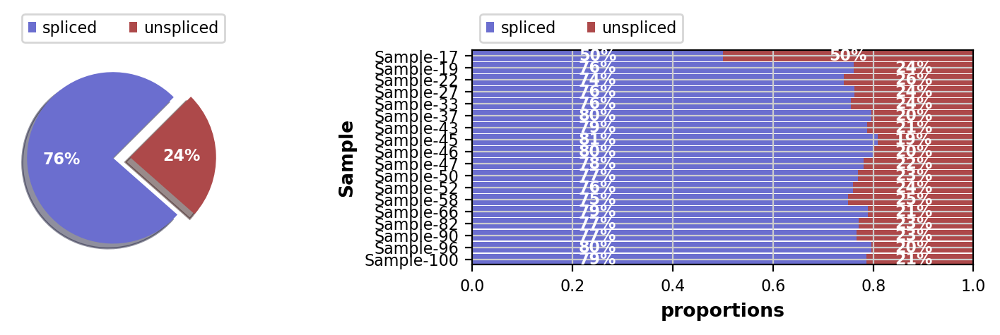

In [12]:
scv.pl.proportions(adata, groupby='Sample')

## Quality Control filtering

In [15]:
# load unfiltered data 
adata = sc.read_h5ad('{}Swarup_2021_unfiltered.h5ad'.format(data_dir))
type(adata)

anndata._core.anndata.AnnData

In [16]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=True, inplace=True)

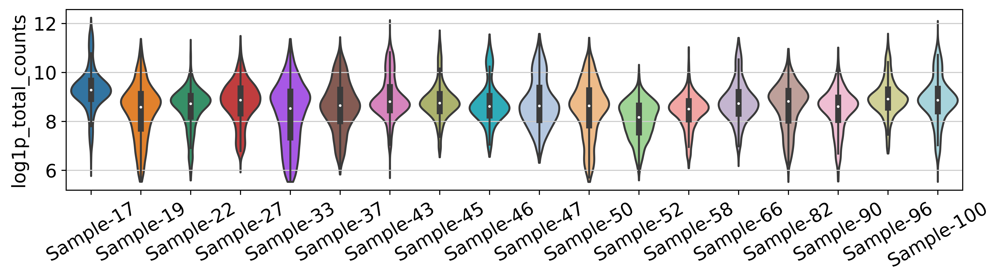

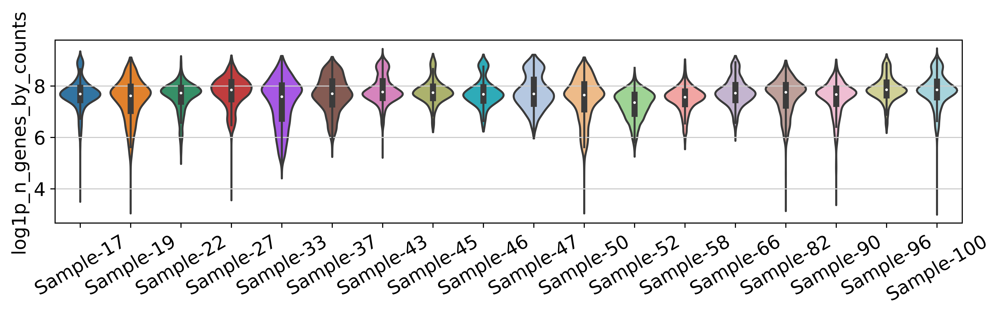

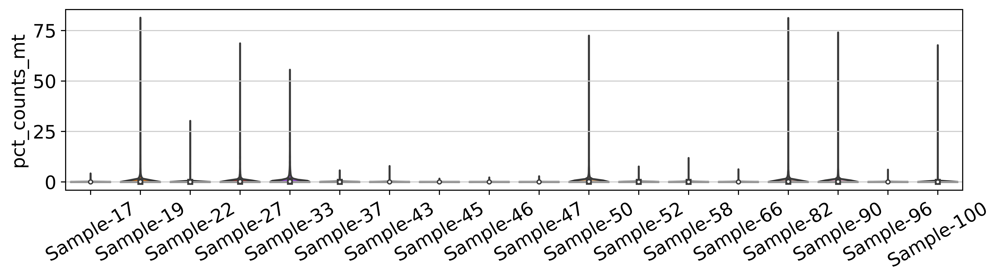

In [17]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'log1p_total_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'log1p_n_genes_by_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)

In [18]:

mt_quantile = 0.975 
umi_quantile = 0.975
doublet_quantile = 0.95

samples = adata.obs.Sample.value_counts().index.to_list()
good_barcodes = []
for cur_sample in samples:
    
    # get just this sample
    cur_adata = adata[adata.obs.Sample == cur_sample]
    orig_cells = cur_adata.shape[0]
    
    # compute cutoffs for each sample
    mt_cutoff = cur_adata.obs.pct_counts_mt.quantile(mt_quantile)
    umi_cutoff = cur_adata.obs.total_counts.quantile(umi_quantile)
    doublet_cutoff = cur_adata.obs.doublet_scores.quantile(doublet_quantile)
    
    # subset the data based on thresholds
    cur_adata = cur_adata[(cur_adata.obs.pct_counts_mt < mt_cutoff) & (cur_adata.obs.total_counts < umi_cutoff) & (cur_adata.obs.doublet_scores < doublet_cutoff)]
    new_cells = cur_adata.shape[0]
    
    keep_cells = cur_adata.obs.barcode.to_list() 
    good_barcodes = good_barcodes + keep_cells
    print(cur_sample, 'removed ', orig_cells-new_cells, ', kept ', new_cells)

    

Sample-100 removed  487 , kept  4367
Sample-43 removed  480 , kept  4370
Sample-45 removed  521 , kept  4276
Sample-96 removed  486 , kept  4000
Sample-17 removed  419 , kept  3789
Sample-37 removed  435 , kept  3606
Sample-27 removed  392 , kept  3579
Sample-33 removed  435 , kept  3495
Sample-19 removed  414 , kept  3413
Sample-46 removed  402 , kept  3111
Sample-50 removed  355 , kept  3033
Sample-52 removed  363 , kept  2756
Sample-22 removed  312 , kept  2685
Sample-47 removed  292 , kept  2655
Sample-58 removed  345 , kept  2560
Sample-90 removed  283 , kept  2606
Sample-66 removed  293 , kept  2571
Sample-82 removed  311 , kept  2471


In [19]:
# subset the full data by the good barcodes
adata = adata[adata.obs.index.isin(good_barcodes)]
adata

View of AnnData object with n_obs × n_vars = 59343 × 36601
    obs: 'orig_barcode', 'n_counts', 'doublet_scores', 'doublets', 'Sample', 'Study', 'batch', 'barcode', 'Sample.ID', 'Case.Year', 'YEAR', 'Library.Batch', 'Case.Num', 'SampleID_Box', 'Region', 'Neuropath.Dx.1', 'Neuropath.Dx.2', 'FCx..g.', 'CBL..g.', 'Age', 'Sex', 'PMI', 'APoE', 'Clinical.Syndrome', 'Tangle.Stage', 'Plaque.Stage', 'Diagnosis', 'Plaques.Tangles', 'Braak...Braak.Stage', 'RIN.MOD', 'RNA.Concentration', 'Exp date', 'i7-Sample Index', 'Total cells', 'Genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'Sample_colors'
    layers: 'counts', 'spliced', 'unspliced'

In [20]:
adata = adata[adata.obs.n_genes_by_counts >= 250]
adata = adata[adata.obs.pct_counts_mt <= 10]

adata.shape

(59098, 36601)

In [21]:
adata.layers['spliced'].shape

(59098, 36601)

## Process data:

In [19]:
# preserve the counts in its own layer
adata.layers['counts'] = adata.X

In [20]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [21]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'], n_jobs=16)
sc.pp.scale(adata, max_value=10)


In [22]:
sc.tl.pca(adata, svd_solver='arpack')

In [33]:
adata.obs = adata.obs.rename({"Library.Batch": "Batch"}, axis=1)
adata.obs.Batch = adata.obs.Batch.astype(str)

# key must be a string for this to work!!
sc.external.pp.harmony_integrate(adata, key = 'Sample')

2022-03-04 22:12:58,735 - harmonypy - INFO - Iteration 1 of 10
2022-03-04 22:13:23,137 - harmonypy - INFO - Iteration 2 of 10
2022-03-04 22:13:47,375 - harmonypy - INFO - Iteration 3 of 10
2022-03-04 22:14:11,672 - harmonypy - INFO - Iteration 4 of 10
2022-03-04 22:14:35,998 - harmonypy - INFO - Iteration 5 of 10
2022-03-04 22:14:50,799 - harmonypy - INFO - Iteration 6 of 10
2022-03-04 22:14:59,269 - harmonypy - INFO - Iteration 7 of 10
2022-03-04 22:15:07,730 - harmonypy - INFO - Iteration 8 of 10
2022-03-04 22:15:16,193 - harmonypy - INFO - Iteration 9 of 10
2022-03-04 22:15:24,567 - harmonypy - INFO - Iteration 10 of 10
2022-03-04 22:15:33,056 - harmonypy - INFO - Stopped before convergence


In [34]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=20, n_pcs=30, metric='cosine')

In [35]:
sc.tl.umap(adata, min_dist=0.35, method='umap')

In [36]:
sc.tl.leiden(adata, resolution=1)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata, 'leiden')

... storing 'Batch' as categorical


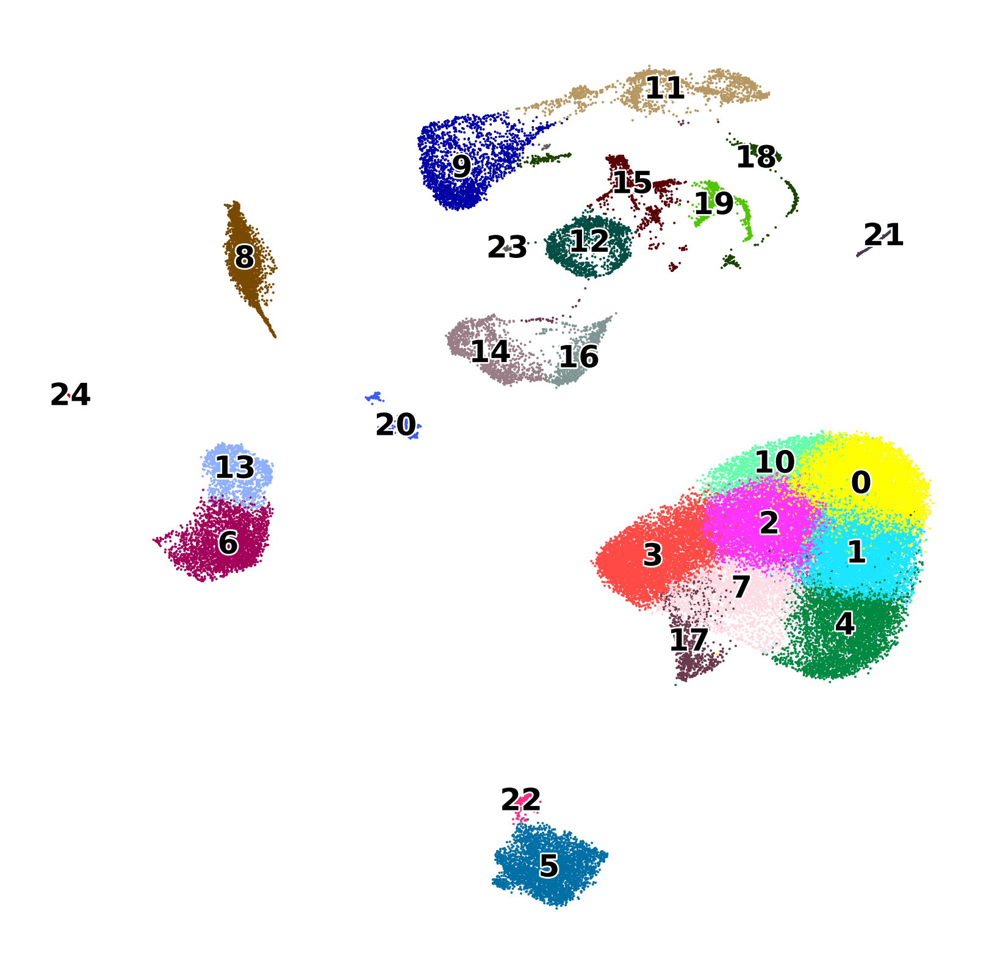

In [37]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title='',
    save='_leiden.pdf'
)


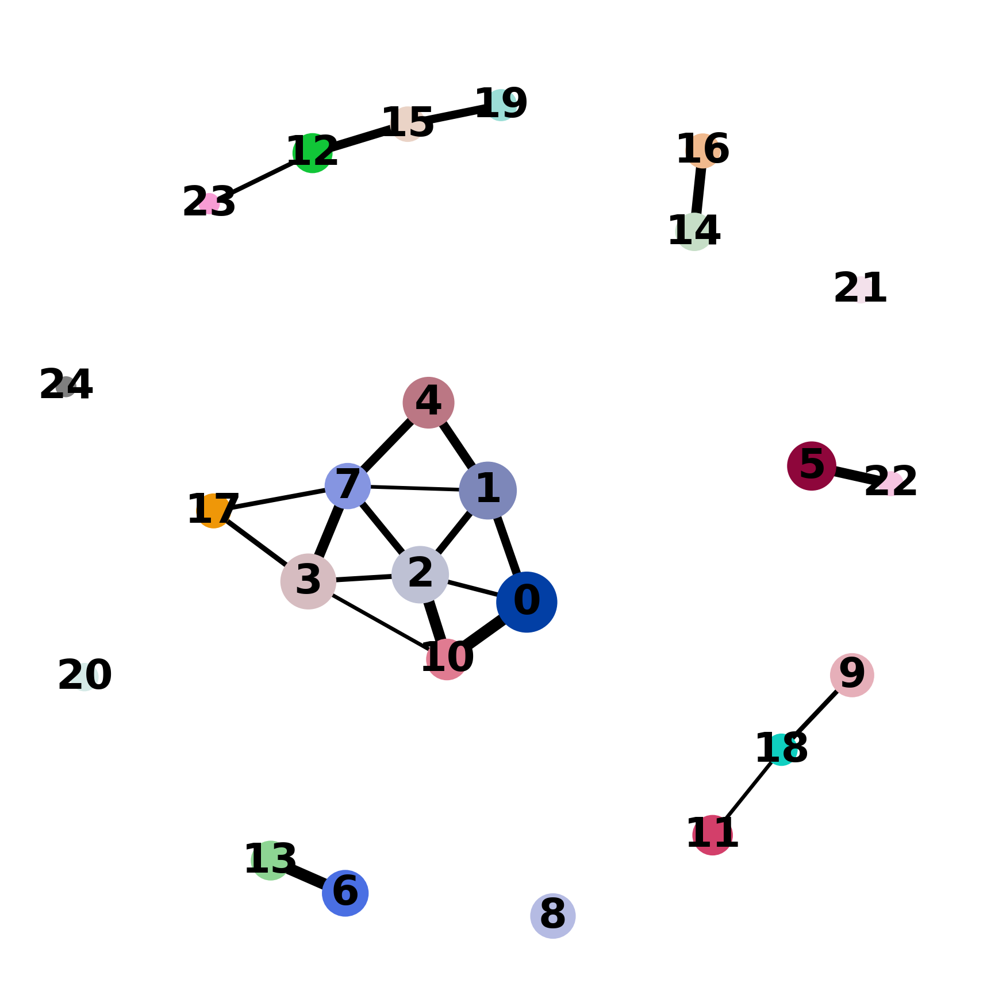

In [40]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.tl.paga(adata)
sc.pl.paga(
    adata, threshold=0.3, title='', edge_width_scale=0.5,
    frameon=False, save=True
)


In [41]:
# re-compute UMAP using paga as initial position
sc.tl.umap(adata, min_dist=0.4, init_pos='paga')

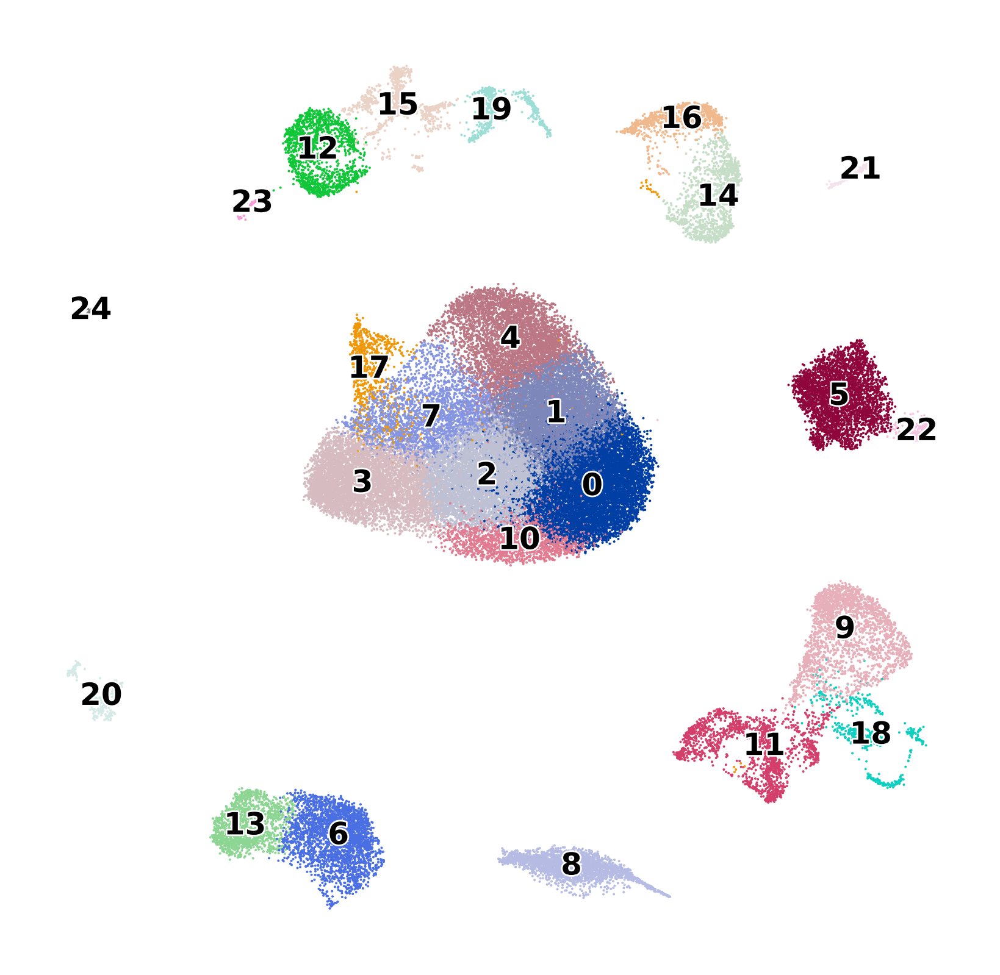

In [42]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title='',
    save='_leiden_paga.pdf'
)


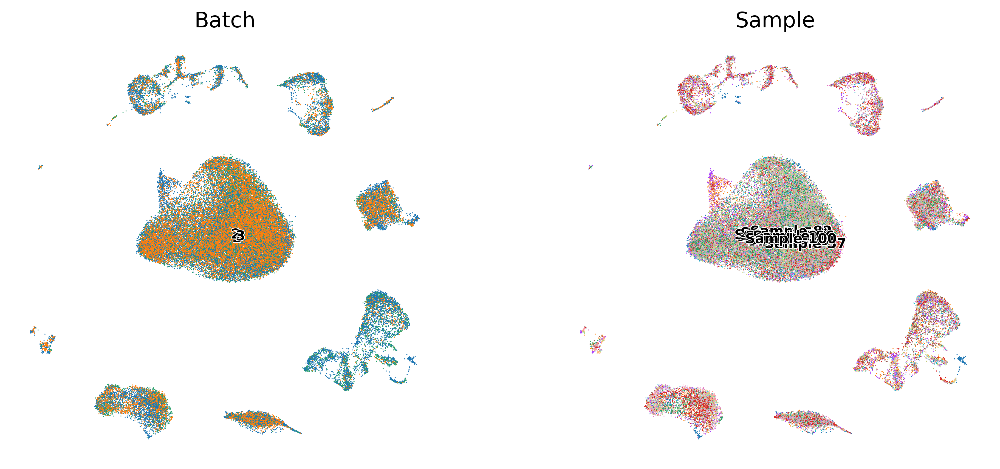

In [43]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['Batch', 'Sample'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    save='_Sample.pdf'
)

categories: 0, 1, 2, etc.
var_group_labels: Oligodendrocyte, Astrocyte, Microglia, etc.


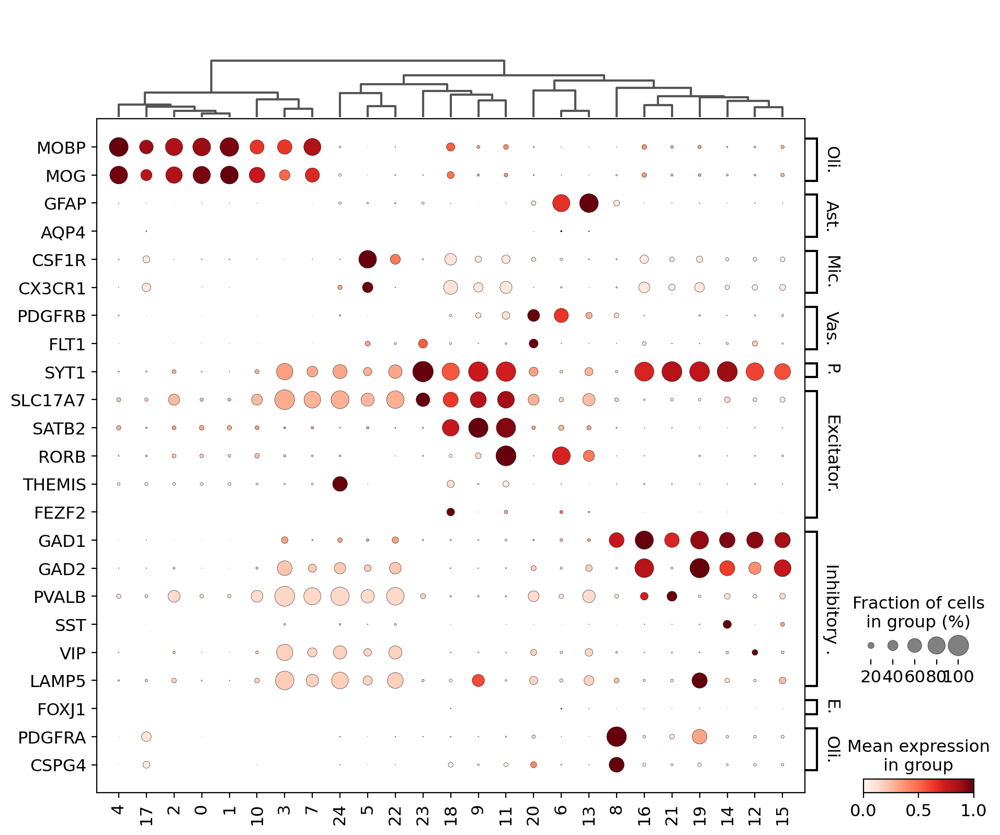

In [45]:
marker_dict = {
    'Oligodendrocyte': ['MOBP', 'MOG'],
    'Astrocyte': ['GFAP', 'AQP4'],
    'Microglia': ['CSF1R', 'CX3CR1',],
    'Vasculature': ['PDGFRB', 'FLT1'],
    'Pan-neuronal': ['SYT1'],
    'Excitatory Neuron': ['SLC17A7', 'SATB2', 'RORB', 'THEMIS', 'FEZF2'],
    'Inhibitory Neuron': ['GAD1', 'GAD2', 'PVALB', 'SST', 'VIP', 'LAMP5'],
    'Ependyma' : ['FOXJ1'], # not expressed
    'Oligodendrocyte Progenitor': ['PDGFRA', 'CSPG4']
}

sc.set_figure_params(dpi=100)
sc.pl.dotplot(
    adata, marker_dict, 'leiden', 
    dendrogram=True, 
    standard_scale='var', swap_axes=True
)


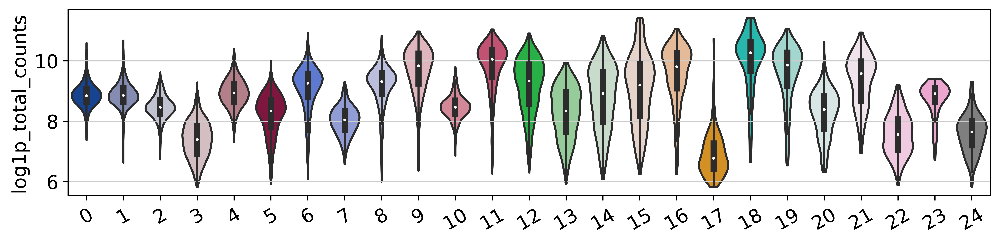

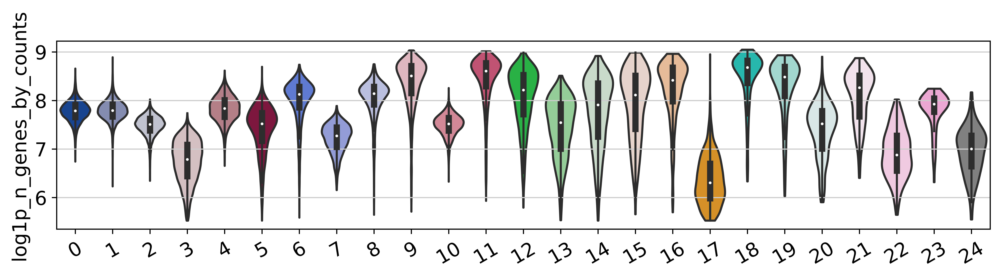

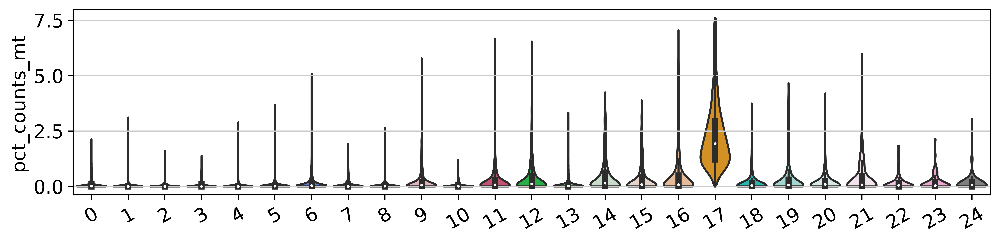

In [46]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'log1p_total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'log1p_n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)

In [47]:
adata.obs.leiden.value_counts()

0     8873
1     7073
2     6876
3     6126
4     4389
5     3546
6     2836
7     2723
8     2531
9     2231
10    1725
11    1535
12    1457
13    1426
14    1213
15     865
16     817
17     806
18     573
19     552
20     318
21     265
22     179
23      84
24      79
Name: leiden, dtype: int64

## Annotate clusters

In [51]:
adata.obs = adata.obs.drop(['cell_type', 'annotation'], axis=1)

In [52]:

# load cluster anno df 
anno_df = pd.read_csv('data/Swarup_2021_leiden.csv')

anno_df.leiden = anno_df.leiden.astype(str)
temp = adata.obs.merge(
    anno_df, how='left',
    on = 'leiden')

adata.obs['cell_type'] = temp['cell_type'].astype(str).to_list()
adata.obs['annotation'] = temp['annotation'].astype(str).to_list()



In [53]:
# remove unknown & doublet clusters:
clusters_to_remove = ['Unknown', 'Doublet']
adata = adata[~adata.obs.annotation.isin(clusters_to_remove)]


Trying to set attribute `.obs` of view, copying.
... storing 'cell_type' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'annotation' as categorical


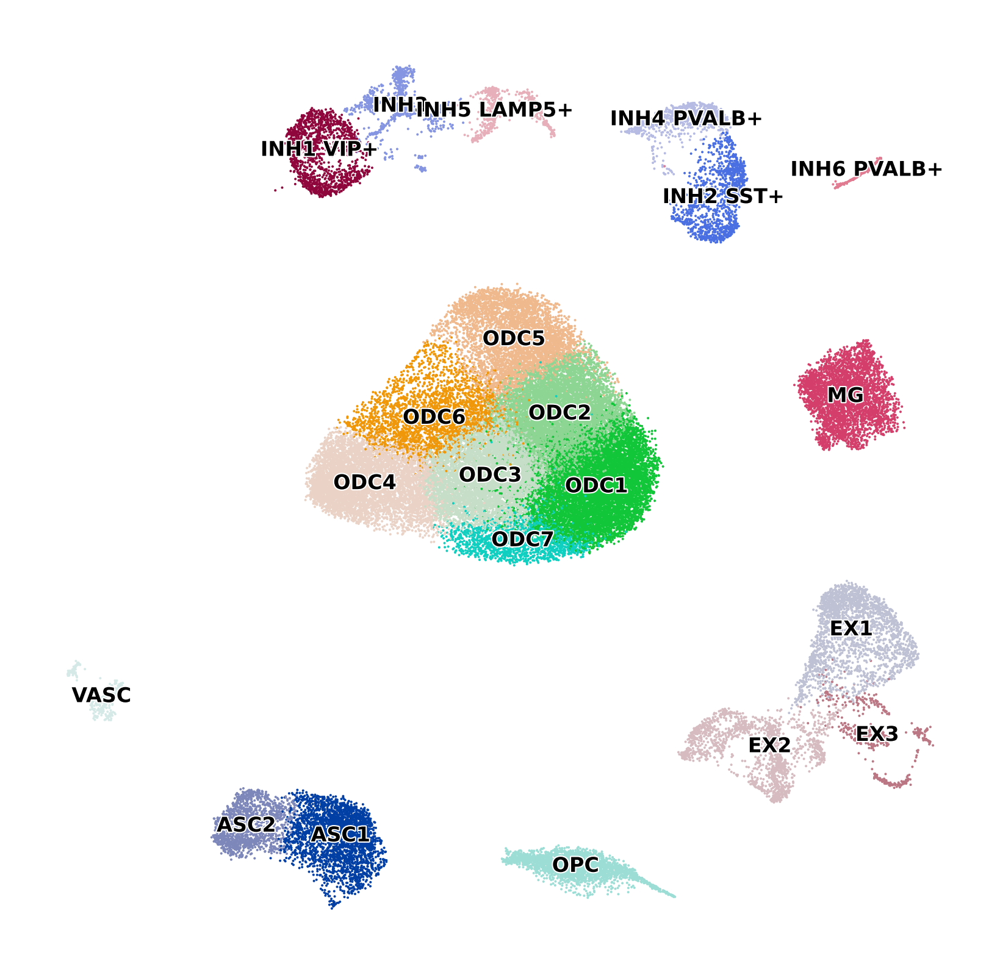

In [54]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=.75, 
    legend_fontsize=6, 
    title='',
    save='_annotation.pdf'
)


In [55]:
sc.tl.umap(adata, min_dist=0.45, method='umap')

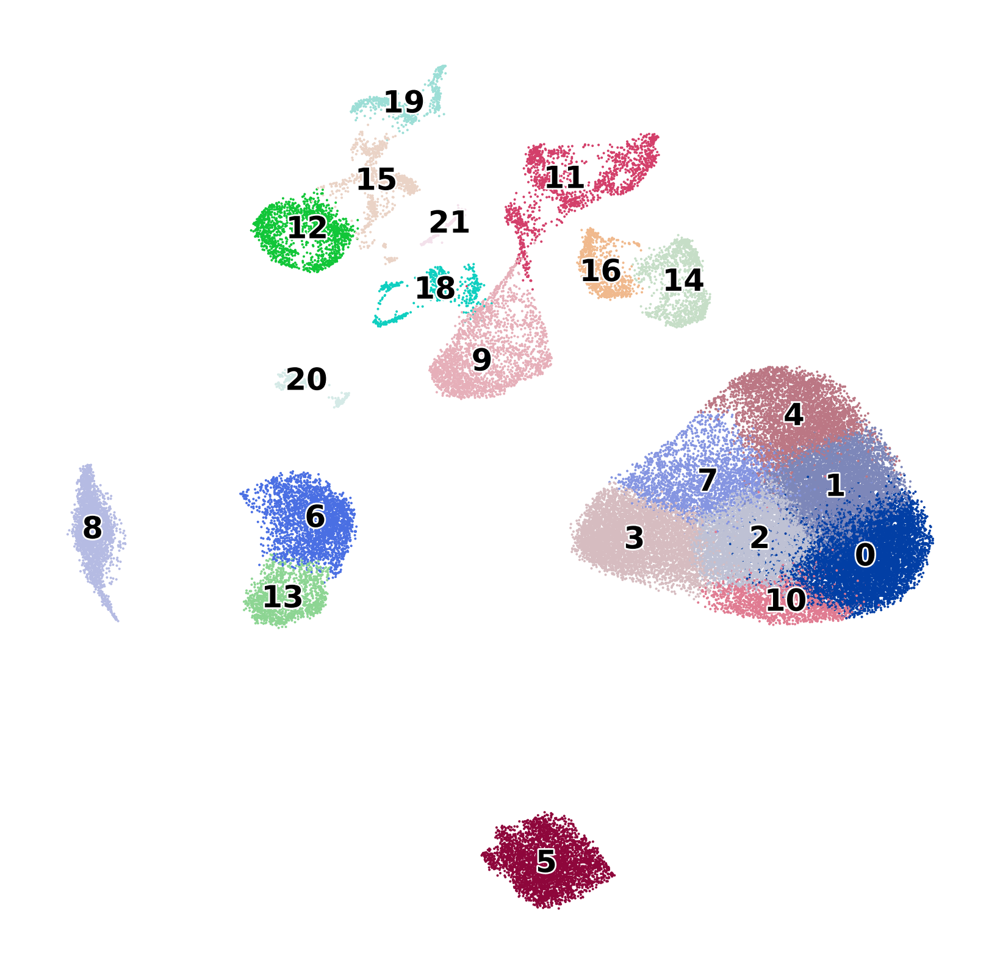

In [56]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title='',
    save='_leiden.pdf'
)


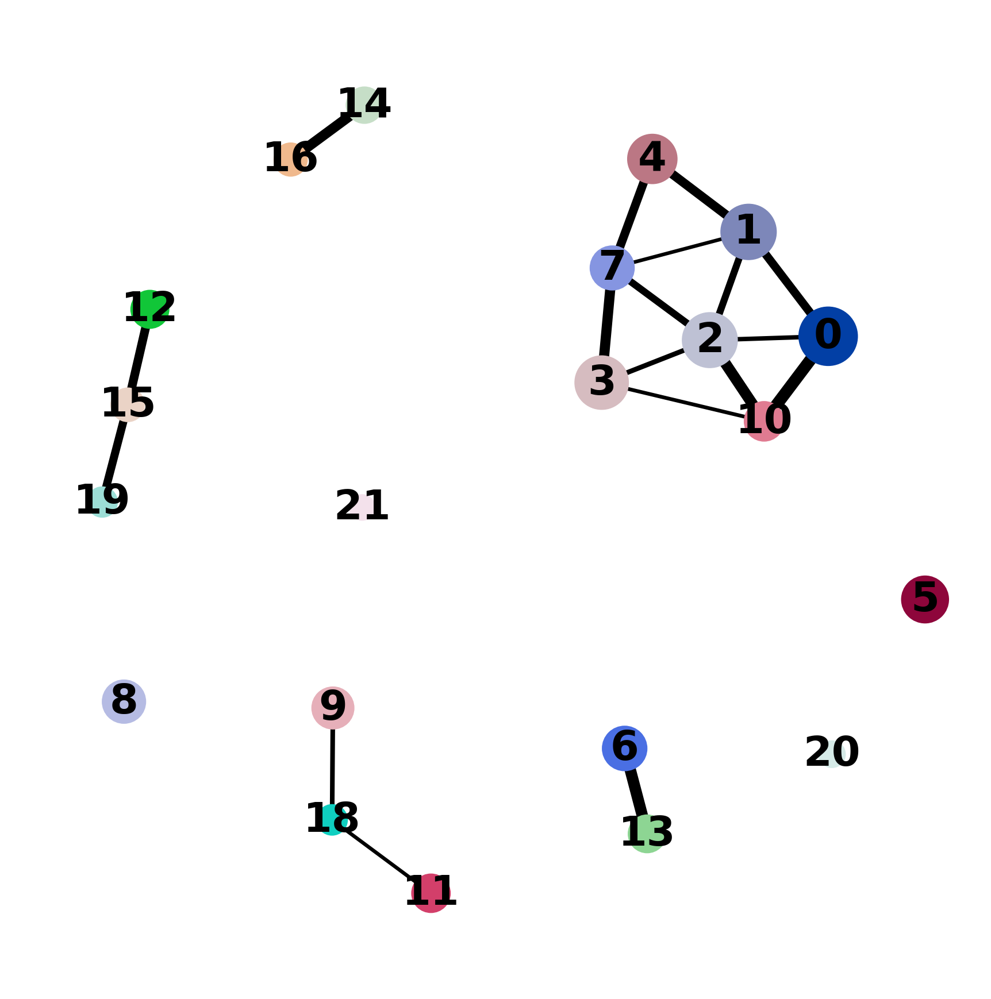

In [57]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.tl.paga(adata)
sc.pl.paga(
    adata, threshold=0.3, title='', edge_width_scale=0.5,
    frameon=False, save=True
)


In [58]:
# re-compute UMAP using paga as initial position
sc.tl.umap(adata, min_dist=0.45, init_pos='paga')

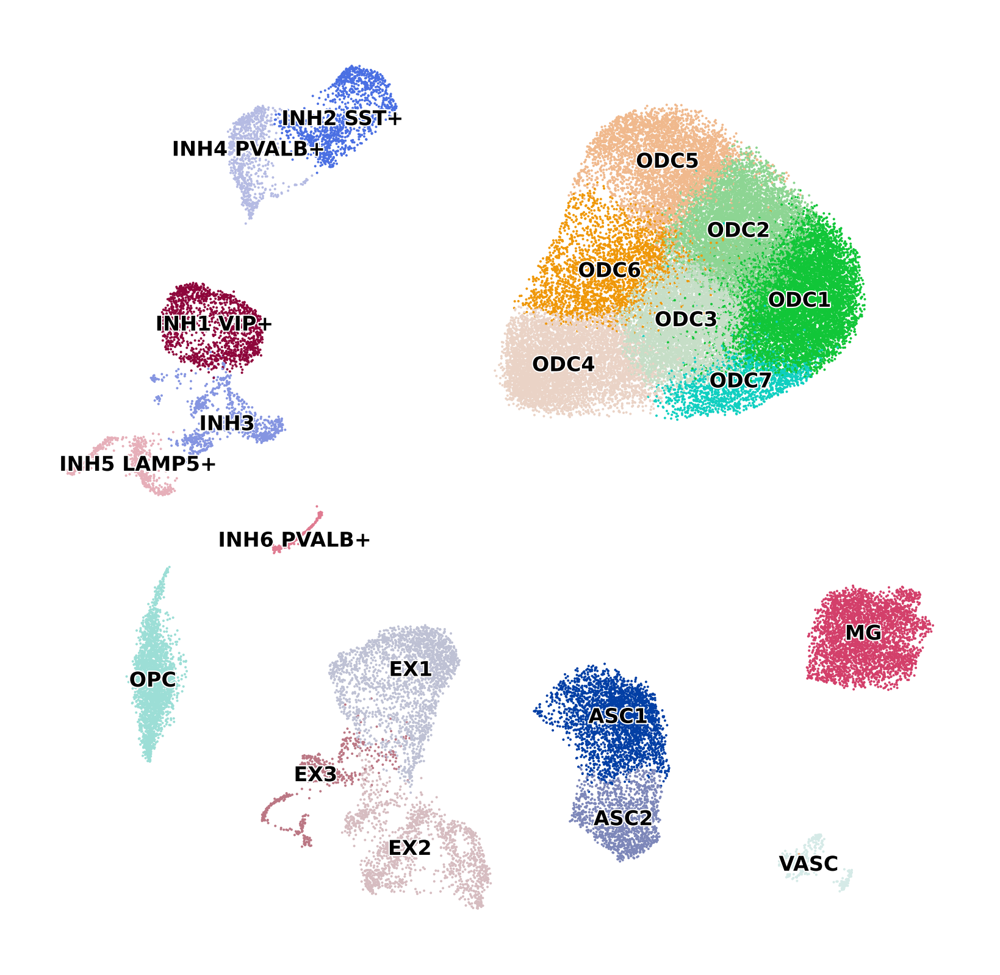

In [59]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=.75, 
    legend_fontsize=6, 
    title='',
    save='_annotation.pdf'
)


In [61]:
adata

AnnData object with n_obs × n_vars = 57950 × 36601
    obs: 'orig_barcode', 'n_counts', 'doublet_scores', 'doublets', 'Sample', 'Study', 'batch', 'barcode', 'Sample.ID', 'Case.Year', 'YEAR', 'Batch', 'Case.Num', 'SampleID_Box', 'Region', 'Neuropath.Dx.1', 'Neuropath.Dx.2', 'FCx..g.', 'CBL..g.', 'Age', 'Sex', 'PMI', 'APoE', 'Clinical.Syndrome', 'Tangle.Stage', 'Plaque.Stage', 'Diagnosis', 'Plaques.Tangles', 'Braak...Braak.Stage', 'RIN.MOD', 'RNA.Concentration', 'Exp date', 'i7-Sample Index', 'Total cells', 'Genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'annotation'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'le

## Save processed dataset:

In [62]:
# write anndata:
adata.write_h5ad('{}/Swarup_2021_processed.h5ad'.format(data_dir))

In [63]:
# write obs table 
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]
adata.obs.to_csv('{}/Swarup_2021_processed_obs.csv'.format(data_dir))

# write var table:
adata.var.to_csv('{}/Swarup_2021_processed_var.csv'.format(data_dir))

In [ ]:
# save the sparse matrix for Seurat:
X = adata.layers['counts']
X = scipy.sparse.csr_matrix.transpose(X)
io.mmwrite('{}Swarup_2021_counts.mtx'.format(data_dir), X)

In [ ]:
# save the Harmony Matrix for Seurat:
pd.DataFrame(adata.obsm['X_pca_harmony']).to_csv('{}/Swarup_2021_processed_harmony.csv'.format(data_dir))
